In [1]:
%pip install virtualenv

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import numpy as np

#chargement et affichage des données
data = pd.read_csv('p2-arbres-fr.csv')
data.head()

,id;type_emplacement;domanialite;arrondissement;complement_addresse;numero;lieu;id_emplacement;libelle_francais;genre;espece;variete;circonference_cm;hauteur_m;stade_developpement;remarquable;geo_point_2d_a;geo_point_2d_b
0,99874;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
1,99875;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
2,99876;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
3,99877;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
4,99878;Arbre;Jardin;PARIS 17E ARRDT;;;PARC CLIC...


In [5]:
#On remarque que le tableau ne comporte qu'une seule colonne et 200k lignes
data.shape

(200137, 1)

In [6]:
#on regarde la forme des individus dans cette colonne
data_array = np.array(data)
data_array[0, :]

array(['99874;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E;19;Marronnier;Aesculus;hippocastanum;;20;5;;0;48.8576199541;2.3209621099'],
      dtype=object)

In [7]:
#On change le nom de la colonne illisible
df_valeurs = pd.DataFrame(data_array, columns=['Valeurs'])
df_valeurs

,Valeurs
0,99874;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
1,99875;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
2,99876;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
3,99877;Arbre;Jardin;PARIS 7E ARRDT;;;MAIRIE DU ...
4,99878;Arbre;Jardin;PARIS 17E ARRDT;;;PARC CLIC...
...,...
200132,2024741;Arbre;Jardin;BOIS DE VINCENNES;;;ARBOR...
200133,2024742;Arbre;Jardin;BOIS DE VINCENNES;;;ARBOR...
200134,2024743;Arbre;Jardin;BOIS DE VINCENNES;;;ARBOR...
200135,2024744;Arbre;Jardin;BOIS DE VINCENNES;;;ARBOR...


In [8]:
#on constate que dans l'unique colonne il y a de nombreuses informations mal séparé par des points virgules
#on crée un nouveau tableau avec de bonne colonne et on y mettra les valeurs correspondantes
data_corrected = np.empty((200137, 10))
data_corrected[:] = np.nan
df = pd.DataFrame(data_corrected, columns=['Identifiant', 'Type', 'Emplacement', 
                                 'Domanialité', 'Libellé français', 'Genre', 'Espèce', 'Variété',
                                'Circonférence (m)', 'Hauteur (m)'])
df

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
200132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
#on va remplir le tableau avec les valeurs correspondantes
df['Identifiant'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[0]
df['Type'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[1]
df['Emplacement'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[2]
df['Domanialité'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[3]
df['Libellé français'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[8]
df['Genre'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[9]
df['Espèce'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[10]
df['Variété'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[11]
df['Circonférence (m)'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[12]
df['Hauteur (m)'] = df_valeurs['Valeurs'].str.split(';', n=18, expand=True)[13]

In [10]:
df

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
0,99874,Arbre,Jardin,PARIS 7E ARRDT,Marronnier,Aesculus,hippocastanum,,20,5
1,99875,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,65,8
2,99876,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,90,10
3,99877,Arbre,Jardin,PARIS 7E ARRDT,Erable,Acer,negundo,,60,8
4,99878,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,38,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0,0


In [11]:
#on modifie le type et l'échelle de valeur pour pouvoir les traiter correctement
df['Circonférence (m)'] = df['Circonférence (m)'].astype(int)
df['Hauteur (m)'] = df['Hauteur (m)'].astype(int)

In [12]:
df['Circonférence (m)'] = df['Circonférence (m)'] / 100

In [13]:
df

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
0,99874,Arbre,Jardin,PARIS 7E ARRDT,Marronnier,Aesculus,hippocastanum,,0.20,5
1,99875,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.65,8
2,99876,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.90,10
3,99877,Arbre,Jardin,PARIS 7E ARRDT,Erable,Acer,negundo,,0.60,8
4,99878,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.38,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0.00,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0.00,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0.00,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0.00,0


In [14]:
df.dtypes

Identifiant           object
Type                  object
Emplacement           object
Domanialité           object
Libellé français      object
Genre                 object
Espèce                object
Variété               object
Circonférence (m)    float64
Hauteur (m)            int64
dtype: object

In [15]:
#on regarde si des valeurs n'ont pas été mise dans le tableau
df.isnull().sum()

Identifiant          0
Type                 0
Emplacement          0
Domanialité          0
Libellé français     0
Genre                0
Espèce               0
Variété              0
Circonférence (m)    0
Hauteur (m)          0
dtype: int64

In [16]:
#on regarde si des valeurs sont à zéro dans le tableau pour la circonférence
df[df['Circonférence (m)']== 0]

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
1778,101922,Arbre,Jardin,PARIS 19E ARRDT,Erable,Acer,platanoides,,0.0,0
2332,102591,Arbre,Jardin,PARIS 17E ARRDT,Magnolia,Magnolia,x soulangeana,Heaven Scent',0.0,0
2333,102592,Arbre,Jardin,PARIS 17E ARRDT,Magnolia,Magnolia,x soulangeana,Heaven Scent',0.0,0
2405,102744,Arbre,Jardin,PARIS 20E ARRDT,Platane,Platanus,x hispanica,,0.0,0
2430,102773,Arbre,Jardin,PARIS 17E ARRDT,Magnolia,Magnolia,x soulangeana,Sundew',0.0,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0.0,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0.0,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0.0,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0.0,0


In [17]:
#on regarde si des valeurs sont à zéro dans le tableau pour la hauteur
df[df['Hauteur (m)']== 0]

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
4,99878,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.38,0
5,99879,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.38,0
6,99880,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.37,0
11,99885,Arbre,Jardin,PARIS 16E ARRDT,Hêtre,Fagus,sylvatica,Atropunicea',0.30,0
12,99887,Arbre,Jardin,PARIS 16E ARRDT,Micocoulier,Celtis,occidentalis,,2.05,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0.00,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0.00,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0.00,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0.00,0


In [18]:
#on remarque qu'il y a de nombreuses valeurs à zéro qui ne permettent pas d'avoir une bonne représentation du dataset

In [19]:
#on analyse le dataset en recherchant des outliers
#df.describe()
#on supprime la notation scientifique
df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,Circonférence (m),Hauteur (m)
count,200137.00000,200137.00000
mean,0.83380,13.11051
std,6.73190,1971.21739
min,0.00000,0.00000
25%,0.30000,5.00000
50%,0.70000,8.00000
75%,1.15000,12.00000
max,2502.55000,881818.00000


In [20]:
#on analyse les outliers
df[df['Circonférence (m)'] > 8]

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
5264,106662,Arbre,Jardin,PARIS 7E ARRDT,Micocoulier,Celtis,occidentalis,,24.39,19
5717,107152,Arbre,Jardin,PARIS 14E ARRDT,Robinier,Robinia,pseudoacacia,,11.33,10
5979,107423,Arbre,Jardin,PARIS 7E ARRDT,Tilleul,Tilia,n. sp.,,11.38,15
5993,107438,Arbre,Jardin,PARIS 7E ARRDT,Platane,Platanus,x hispanica,,23.00,6
6340,107808,Arbre,Jardin,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,11.20,13
...,...,...,...,...,...,...,...,...,...,...
191872,2014645,Arbre,Jardin,BOIS DE VINCENNES,Hêtre,Fagus,sylvatica,,11.90,22
192901,2015685,Arbre,Jardin,BOIS DE VINCENNES,Pin,Pinus,nigra,,12.00,22
193905,2016858,Arbre,CIMETIERE,VAL-DE-MARNE,,Tilia,,,21.50,10
198023,2021947,Arbre,Alignement,PARIS 15E ARRDT,Erable,Acer,negundo,,27.50,10


In [21]:
df[df['Hauteur (m)'] >= 100]

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
5392,106800,Arbre,Jardin,PARIS 7E ARRDT,Tilleul,Tilia,n. sp.,,1.00,1510
6473,107951,Arbre,Jardin,PARIS 7E ARRDT,Platane,Platanus,x hispanica,,1.12,117
12536,115062,Arbre,Jardin,PARIS 16E ARRDT,Erable,Acer,n. sp.,,0.47,255
15373,118412,Arbre,Jardin,PARIS 7E ARRDT,Paulownia,Paulownia,tomentosa,,1.45,810
24099,128185,Arbre,Jardin,PARIS 17E ARRDT,Platane,Platanus,x hispanica,,1.30,125
...,...,...,...,...,...,...,...,...,...,...
189053,2011417,Arbre,Jardin,BOIS DE VINCENNES,Pin,Pinus,mugo,,0.60,150
189441,2011863,Arbre,DFPE,PARIS 16E ARRDT,Marronnier,Aesculus,hippocastanum,Baumannii',0.08,157
189518,2011961,Arbre,Alignement,BOIS DE BOULOGNE,Platane,Platanus,x hispanica,,0.67,105
197136,2020792,Arbre,Jardin,PARIS 14E ARRDT,Erable,Acer,platanoides,,1.45,125


In [22]:
#on arrive pas à analyse les outliers de cette manière donc on fait une étude approfondie sur chaque arbre
print(df['Libellé français'].unique())

['Marronnier' 'If' 'Erable' 'Arbre à miel' 'Platane' 'Sophora'
 'Prunus n. sp.' 'Hêtre' 'Micocoulier' 'Tilleul' 'Chêne' 'Savonnier'
 'Copalme' 'Noyer' 'Arbre à caramel' 'Troene' 'Tulipier' 'Pin' 'Sapin'
 'Cerisier à fleurs' 'Charme-Houblon' 'Cèdre' 'Paulownia' 'Thuya'
 'Pommier à fleurs' 'Poirier' 'Pommier' 'Bouleau' 'Orme' 'Arbre de Judée'
 'Robinier' 'Frêne' 'Aubépine' 'Fevier' 'Prunier à fleurs'
 'Arbre aux quarante écus' 'Néflier commun' 'Saule' 'Magnolia'
 'Prunier à fruits' 'Poirier à fleurs' 'Peuplier' 'Faux-cyprès' 'Aubepine'
 '' 'Plaqueminier' 'Mûrier' 'Pêcher' 'Pterocarya' 'Merisier'
 'Noisetier de Byzance' 'Alisier' 'Cognassier'
 'Parrotie de Perse - Arbre de fer' 'Poirier à fruits' 'Orme de Sibérie'
 'Frêne à fleurs' 'Aulne' 'Troëne' 'Fontanesia' 'Cornouiller' 'Cedrele'
 'Catalpa' 'Houx' 'Buis' 'Metaséquoia' 'Chicot du Canada'
 'Oranger des Osages' 'Céphalotaxe' 'Sumac' 'Châtaignier' 'Ailante'
 'Sequoia' 'Lilas des indes' 'Pterostyrax' 'Eucalyptus' 'Olivier'
 'Figuier' 'Cha

In [23]:
#Combien il y a d'espèces d'arbres différentes
df['Libellé français'].unique().shape

(193,)

In [24]:
#On se rend compte que de nombreux arbres on des valeurs aberrantes par rapport à leur espèce
#un tilleul fait en moyenne 20 mètres avec des cas exceptionnel à 50 mètres
df.loc[(df['Libellé français'] == 'Tilleul') & (df['Hauteur (m)'] >= 100), :]

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
5392,106800,Arbre,Jardin,PARIS 7E ARRDT,Tilleul,Tilia,n. sp.,,1.00,1510
113295,234857,Arbre,Alignement,PARIS 19E ARRDT,Tilleul,Tilia,n. sp.,,0.75,106
120292,243307,Arbre,Alignement,PARIS 19E ARRDT,Tilleul,Tilia,x europaea,Euchlora',0.70,610
120370,243386,Arbre,Alignement,PARIS 19E ARRDT,Tilleul,Tilia,x europaea,Euchlora',0.80,107
151364,275451,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,75.40,815
151382,275469,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,0.85,1515
151443,275530,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,1.30,110
151647,275737,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,0.65,118
151918,276009,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,1.80,218
152205,276297,Arbre,Alignement,PARIS 7E ARRDT,Tilleul,Tilia,tomentosa,,1.30,1815


In [25]:
df[df['Libellé français'] == 'Tilleul']['Hauteur (m)'].mean()

50.58502698896972

In [26]:
df[df['Libellé français'] == 'Tilleul']['Hauteur (m)'].quantile([0.25, 0.50, 0.99])

0.25     5.0
0.50    10.0
0.99    20.0
Name: Hauteur (m), dtype: float64

In [27]:
tree_name = df['Libellé français'].unique()

for i in tree_name:
    last_quantile = df[df['Libellé français'] == i]['Hauteur (m)'].quantile([0.25, 0.50, 0.95])
    print(i,last_quantile.loc[0.95])

Marronnier 20.0
If 12.0
Erable 17.0
Arbre à miel 10.0
Platane 24.0
Sophora 17.0
Prunus n. sp. 9.0
Hêtre 18.0
Micocoulier 15.0
Tilleul 17.0
Chêne 22.0
Savonnier 11.0
Copalme 12.0
Noyer 15.0
Arbre à caramel 7.75
Troene 8.0
Tulipier 15.0
Pin 18.0
Sapin 16.0
Cerisier à fleurs 8.0
Charme-Houblon 10.0
Cèdre 22.0
Paulownia 15.0
Thuya 12.0
Pommier à fleurs 10.0
Poirier 8.0
Pommier 7.0
Bouleau 14.599999999999909
Orme 17.0
Arbre de Judée 8.0
Robinier 18.0
Frêne 15.0
Aubépine 7.0
Fevier 15.0
Prunier à fleurs 8.0
Arbre aux quarante écus 16.0
Néflier commun 5.0
Saule 18.0
Magnolia 10.0
Prunier à fruits 7.0
Poirier à fleurs 10.0
Peuplier 25.0
Faux-cyprès 10.0
Aubepine 8.0
 15.0
Plaqueminier 14.699999999999989
Mûrier 12.0
Pêcher 5.0
Pterocarya 20.0
Merisier 10.0
Noisetier de Byzance 12.0
Alisier 9.75
Cognassier 5.0
Parrotie de Perse - Arbre de fer 8.0
Poirier à fruits 4.0
Orme de Sibérie 12.099999999999966
Frêne à fleurs 10.0
Aulne 16.0
Troëne 8.0
Fontanesia 10.0
Cornouiller 7.0
Cedrele 15.0
Catalpa 

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(80, 400))

names = df['Libellé français'].unique()

df_tree_height = []
for name in names:
    df_tree_height.append(df[df['Libellé français'] == name]['Circonférence (m)'])

plt.boxplot(df_tree_height, labels=names, vert=False, showfliers=False)

plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.title('Répartition des Circonférence (m) par espèce', fontsize=50)

# Afficher le graphique
plt.show()

In [37]:
plt.figure(figsize=(80, 400))

names = df['Libellé français'].unique()

df_tree_height = []
for name in names:
    df_tree_height.append(df[df['Libellé français'] == name]['Hauteur (m)'])

plt.boxplot(df_tree_height, labels=names, vert=False, showfliers=False)

plt.yticks(fontsize=50)
plt.xticks(fontsize=50)
plt.title('Répartition des Hauteurs (m) par espèce', fontsize=50)

# Afficher le graphique
plt.show()

In [30]:
#on va supprimer les valeurs qui sont des outliers en prenant la moyenne des valeurs de chaque espèce
tree_name = df['Libellé français'].unique()
for i in tree_name:
    last_quantile = df[df['Libellé français'] == i]['Hauteur (m)'].quantile([0.25, 0.50, 0.95])
    index_null_value = df.loc[(df['Libellé français'] == i) & (df['Hauteur (m)'] > last_quantile.loc[0.95])].index
    df.drop(index_null_value , inplace=True)
    

    

In [31]:
df

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
0,99874,Arbre,Jardin,PARIS 7E ARRDT,Marronnier,Aesculus,hippocastanum,,0.20,5
1,99875,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.65,8
2,99876,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.90,10
3,99877,Arbre,Jardin,PARIS 7E ARRDT,Erable,Acer,negundo,,0.60,8
4,99878,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.38,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0.00,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0.00,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0.00,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0.00,0


In [32]:
plt.figure(figsize=(80, 400))

names = df['Libellé français'].unique()

df_tree_height = []
for name in names:
    df_tree_height.append(df[df['Libellé français'] == name]['Hauteur (m)'])

plt.boxplot(df_tree_height, labels=names, vert=False)

plt.yticks(fontsize=50)
plt.xticks(fontsize=50)
plt.title('Répartition des Hauteurs (m) par espèce', fontsize=50)
plt.grid(True)

# Afficher le graphique
plt.show()

In [33]:
df[df['Libellé français'] == 'Tilleul']['Hauteur (m)'].mean()

7.969217151848937

In [34]:
df

,Identifiant,Type,Emplacement,Domanialité,Libellé français,Genre,Espèce,Variété,Circonférence (m),Hauteur (m)
0,99874,Arbre,Jardin,PARIS 7E ARRDT,Marronnier,Aesculus,hippocastanum,,0.20,5
1,99875,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.65,8
2,99876,Arbre,Jardin,PARIS 7E ARRDT,If,Taxus,baccata,,0.90,10
3,99877,Arbre,Jardin,PARIS 7E ARRDT,Erable,Acer,negundo,,0.60,8
4,99878,Arbre,Jardin,PARIS 17E ARRDT,Arbre à miel,Tetradium,daniellii,,0.38,0
...,...,...,...,...,...,...,...,...,...,...
200132,2024741,Arbre,Jardin,BOIS DE VINCENNES,,Castanea,fargesii,,0.00,0
200133,2024742,Arbre,Jardin,BOIS DE VINCENNES,Arbre aux mouchoirs,Davidia,involucrata,,0.00,0
200134,2024743,Arbre,Jardin,BOIS DE VINCENNES,Peuplier,Populus,simonii,,0.00,0
200135,2024744,Arbre,Jardin,BOIS DE VINCENNES,Chêne,Quercus,n. sp.,,0.00,0


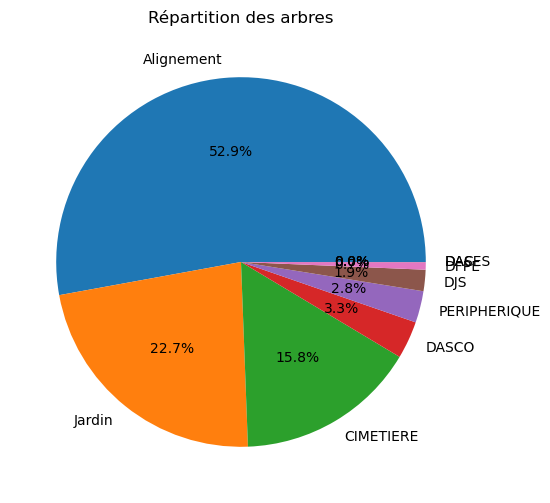

In [35]:
# Compter le nombre d'occurrences de chaque espèce
count = df['Emplacement'].value_counts()

# Créer un diagramme camembert
plt.figure(figsize=(8, 6))  # Définir la taille de la figure
plt.pie(count, labels=count.index, autopct='%1.1f%%')

# Ajouter un titre
plt.title('Répartition des arbres')

# Afficher le graphique
plt.show()

In [36]:
df.describe()

,Circonférence (m),Hauteur (m)
count,191935.000000,191935.000000
mean,0.793885,7.819324
std,6.850623,5.661144
min,0.000000,0.000000
25%,0.300000,4.000000
50%,0.700000,8.000000
75%,1.100000,12.000000
max,2502.550000,27.000000
